# Notebook for mapping scRNAseq Data

Raw data downloaded from [here](https://www.ebi.ac.uk/biostudies/arrayexpress/studies/E-MTAB-12916/sdrf)

    Developed by: Christian Eger
    Würzburg Institute for Systems Immunology - Faculty of Medicine - Julius Maximilian Universität Würzburg
    Created on: 240409
    Last modified: 240415

## Import modules

In [1]:
import os
import pandas as pd
import json
import matplotlib.pyplot as plt

## Creating input file for download and processing script

Downloaded from [**here**](https://www.ebi.ac.uk/biostudies/arrayexpress/studies/E-MTAB-12916?query=E-MTAB-12916)

In [2]:
data_path = '../.data/meta_data/'

In [3]:
meta_data = pd.read_csv(
    filepath_or_buffer=os.path.join(data_path, 'E-MTAB-12916.sdrf.txt'),
    sep='\t'
)
meta_data.head()

,Source Name,Comment[ENA_SAMPLE],Comment[BioSD_SAMPLE],Characteristics[organism],Characteristics[age],Characteristics[developmental stage],Characteristics[sex],Characteristics[individual],Characteristics[organism part],Characteristics[disease],...,Assay Name,Technology Type,Comment[ENA_EXPERIMENT],Scan Name,Comment[SUBMITTED_FILE_NAME],Comment[ENA_RUN],Comment[FASTQ_URI],Comment[read_index],Comment[read_type],Factor Value[organism part]
0,HCAHeart9508627,ERS15408104,SAMEA113412973,Homo sapiens,55 to 60,adult,Male,D3,heart left ventricle,normal,...,HCAHeart9508627,sequencing assay,ERX10811380,HCAHeart9508627_S1_L001_I1_001.fastq.gz,HCAHeart9508627_S1_L001_I1_001.fastq.gz,ERR11403589,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,index1,sample_barcode,heart left ventricle
1,HCAHeart9508627,ERS15408104,SAMEA113412973,Homo sapiens,55 to 60,adult,Male,D3,heart left ventricle,normal,...,HCAHeart9508627,sequencing assay,ERX10811380,HCAHeart9508627_S1_L001_I2_001.fastq.gz,HCAHeart9508627_S1_L001_I2_001.fastq.gz,ERR11403589,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,index2,sample_barcode,heart left ventricle
2,HCAHeart9508627,ERS15408104,SAMEA113412973,Homo sapiens,55 to 60,adult,Male,D3,heart left ventricle,normal,...,HCAHeart9508627,sequencing assay,ERX10811380,HCAHeart9508627_S1_L001_R1_001.fastq.gz,HCAHeart9508627_S1_L001_R1_001.fastq.gz,ERR11403589,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,read1,"cell_barcode,umi_barcode",heart left ventricle
3,HCAHeart9508627,ERS15408104,SAMEA113412973,Homo sapiens,55 to 60,adult,Male,D3,heart left ventricle,normal,...,HCAHeart9508627,sequencing assay,ERX10811380,HCAHeart9508627_S1_L001_R2_001.fastq.gz,HCAHeart9508627_S1_L001_R2_001.fastq.gz,ERR11403589,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,read2,single,heart left ventricle
4,HCAHeart9508628,ERS15408105,SAMEA113412974,Homo sapiens,60 to 65,adult,Male,D7,right cardiac atrium,normal,...,HCAHeart9508628,sequencing assay,ERX10811381,HCAHeart9508628_S1_L001_I1_001.fastq.gz,HCAHeart9508628_S1_L001_I1_001.fastq.gz,ERR11403590,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,index1,sample_barcode,right cardiac atrium


In [13]:
meta_data = meta_data[['Source Name', 'Comment[FASTQ_URI]', 'Comment[SUBMITTED_FILE_NAME]']]
meta_data.to_csv('../.data//downloads_table.csv', header=None)
meta_data.head()

,Source Name,Comment[FASTQ_URI],Comment[SUBMITTED_FILE_NAME]
0,HCAHeart9508627,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeart9508627_S1_L001_I1_001.fastq.gz
1,HCAHeart9508627,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeart9508627_S1_L001_I2_001.fastq.gz
2,HCAHeart9508627,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeart9508627_S1_L001_R1_001.fastq.gz
3,HCAHeart9508627,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeart9508627_S1_L001_R2_001.fastq.gz
4,HCAHeart9508628,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeart9508628_S1_L001_I1_001.fastq.gz
...,...,...,...
183,HCAHeartST13189996,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeartST13189996_S1_L001_R2_001.fastq.gz
184,HCAHeartST13189997,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeartST13189997_S1_L001_I1_001.fastq.gz
185,HCAHeartST13189997,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeartST13189997_S1_L001_I2_001.fastq.gz
186,HCAHeartST13189997,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeartST13189997_S1_L001_R1_001.fastq.gz


## Index file creation

**Comprehensive gene annotation ALL:**
- It contains the comprehensive gene annotation on the reference chromosomes, scaffolds, assembly patches and alternate loci (haplotypes)

**Long non-coding RNA gene annotation CHR:**
- It contains the comprehensive gene annotation of lncRNA genes on the reference chromosomes

**Genome sequence (GRCh38.p14) ALL:**
- Nucleotide sequence of the GRCh38.p14 genome assembly version on all regions, including reference chromosomes, scaffolds, assembly patches and haplotypes
- The sequence region names are the same as in the GTF/GFF3 files

downloaded from [**here**](https://www.gencodegenes.org/human/)

In [6]:
%%bash
index_input="../.data/reference_data/"
ls $index_input

gencode.v45.chr_patch_hapl_scaff.annotation.gtf.gz
gencode.v45.long_noncoding_RNAs.gtf.gz
gencode.v45.tRNAs.gtf.gz
GRCh38.p14.genome.fa.gz


[**Documentation**](https://www.kallistobus.tools/kb_usage/kb_ref/)
```
$ kb ref
usage: kb ref [-h] [--tmp TMP] [--keep-tmp] [--verbose] -i INDEX -g T2G -f1
              FASTA [-f2 FASTA] [-c1 T2C] [-c2 T2C] [-n N]
              [-d {human,mouse,linnarsson}] [-k K]
              [--workflow {standard,lamanno,nucleus,kite}] [--lamanno]
              [--overwrite]
              fasta gtf [feature]

Build a kallisto index and transcript-to-gene mapping

positional arguments:
  fasta                 Genomic FASTA file(s), comma-delimited
  gtf                   Reference GTF file(s), comma-delimited
  feature               [`kite` workflow only] Path to TSV containing barcodes
                        and feature names.

optional arguments:
  -h, --help            Show this help message and exit
  --tmp TMP             Override default temporary directory
  --keep-tmp            Do not delete the tmp directory
  --verbose             Print debugging information
  -n N                  Number of files to split the index into. If this
                        option is specified, the FASTA that is normally used
                        to create an index is split into `N` approximately-
                        equal parts. Each of these FASTAs are indexed
                        separately.
  -d {human,mouse,linnarsson}
                        Download a pre-built kallisto index (along with all
                        necessary files) instead of building it locally
  -k K                  Use this option to override the k-mer length of the
                        index. Usually, the k-mer length automatically
                        calculated by `kb` provides the best results.
  --workflow {standard,lamanno,nucleus,kite}
                        Type of workflow to prepare files for. Use `lamanno`
                        for RNA velocity based on La Manno et al. 2018 logic.
                        Use `nucleus` for RNA velocity on single-nucleus RNA-
                        seq reads. Use `kite` for feature barcoding. (default:
                        standard)
  --lamanno             Deprecated. Use `--workflow lamanno` instead.
  --overwrite           Overwrite existing kallisto index

required arguments:
  -i INDEX              Path to the kallisto index to be constructed. If `-n`
                        is also specified, this is the prefix for the n
                        indices to construct.
  -g T2G                Path to transcript-to-gene mapping to be generated
  -f1 FASTA             [Optional with -d] Path to the cDNA FASTA (lamanno,
                        nucleus) or mismatch FASTA (kite) to be generated

required arguments for `lamanno` and `nucleus` workflows:
  -f2 FASTA             Path to the intron FASTA to be generated
  -c1 T2C               Path to generate cDNA transcripts-to-capture
  -c2 T2C               Path to generate intron transcripts-to-capture
```

In [1]:
%%bash
index_input="../.data/reference_data/"
index_output="../.data/kb_index/"

if [ ! -d "$index_output" ]; then
    mkdir -p "$index_output"
fi

kb ref -i "$index_output/transcriptome.idx" \
        -g "$index_output/transcripts_to_genes.txt" \
        -f1 "$index_output/cdna.fa" \
        -f2 "$index_output/intron.fa" \
        -c1 "$index_output/cdna_transcripts_to_capture.txt" \
        -c2 "$index_output/intron_transcripts_to_capture.txt" \
        --workflow lamanno \
        --overwrite \
        "$index_input/GRCh38.p14.genome.fa.gz" \
        "$index_input/gencode.v45.chr_patch_hapl_scaff.annotation.gtf.gz" \
        "$index_input/gencode.v45.long_noncoding_RNAs.gtf.gz" \
        

[2024-04-16 14:08:13,994]    INFO [ref_lamanno] Preparing ../.data/reference_data//GRCh38.p14.genome.fa.gz, ../.data/reference_data//gencode.v45.chr_patch_hapl_scaff.annotation.gtf.gz
[2024-04-16 14:09:00,473]    INFO [ref_lamanno] Splitting genome ../.data/reference_data//GRCh38.p14.genome.fa.gz into cDNA at /mnt/LaCIE/ceger/Projects/human_heart_mapping/human_heart_mapping/0-raw_data_processing/0-240409-E-MTAB-12916/0-240409-kallisto_bustools/tmp/tmp56wfzduq
[2024-04-16 14:10:03,337]    INFO [ref_lamanno] Creating cDNA transcripts-to-capture at /mnt/LaCIE/ceger/Projects/human_heart_mapping/human_heart_mapping/0-raw_data_processing/0-240409-E-MTAB-12916/0-240409-kallisto_bustools/tmp/tmp2u7ghnmu
[2024-04-16 14:10:03,918]    INFO [ref_lamanno] Splitting genome into introns at /mnt/LaCIE/ceger/Projects/human_heart_mapping/human_heart_mapping/0-raw_data_processing/0-240409-E-MTAB-12916/0-240409-kallisto_bustools/tmp/tmpvhft6py_
[2024-04-16 14:14:03,895]    INFO [ref_lamanno] Creating intr

## *optional: Preparations before continuing an aborted mapping process

Finds directories that dont contain '10x_version3_whitelist.txt' aka ones that havent been mapped

In [1]:
%%bash

directory="../.data/mapping/"

while IFS= read -r folder; do
    if [ ! -f "$folder/10x_version3_whitelist.txt" ]; then
        echo "$folder"
        break 
    fi
done < <(find "$directory" -mindepth 1 -maxdepth 1 -type d)


../.data/mapping/HCAHeartST13180618


make sure that is the correct folder and then delete it

In [2]:
%%bash

ls ../.data/mapping/HCAHeartST13180618

HCAHeartST13180618_S1_L001_I1_001.fastq.gz
HCAHeartST13180618_S1_L001_I2_001.fastq.gz
HCAHeartST13180618_S1_L001_R1_001.fastq.gz
HCAHeartST13180618_S1_L001_R2_001.fastq.gz
HCAHeartST13180618_S1_L001_R2_001.fastq.gz.st


In [3]:
%%bash

rm -rf ../.data/mapping/HCAHeartST13180618

Finds folders that have been mapped

In [4]:
%%bash
directory="../.data/mapping/"

folders=$(find "$directory" -mindepth 1 -maxdepth 1 -type d -exec test -e "{}/10x_version3_whitelist.txt" \; -printf "'%f',\n")

folders="${folders%,}"

echo "${folders}"


'HCAHeartST13146201',
'HCAHeartST10773170',
'HCAHeart9845433',
'HCAHeartST10773171',
'HCAHeartST11064577',
'HCAHeartST10773169',
'HCAHeartST11350194',
'HCAHeartST13180616',
'HCAHeart9845436',
'HCAHeartST13146206',
'HCAHeartST10773166',
'HCAHeart9508627',
'HCAHeartST11064574',
'HCAHeartST11350193',
'HCAHeartST13146202',
'HCAHeartST11350184',
'HCAHeartST11350195',
'HCAHeartST11350197',
'HCAHeart9845432',
'HCAHeartST11350196',
'HCAHeartST13146204',
'HCAHeartST10773165',
'HCAHeartST13146207',
'HCAHeartST11064576',
'HCAHeart9845434',
'HCAHeart9508628',
'HCAHeartST13180615',
'HCAHeart9845435',
'HCAHeartST11350186',
'HCAHeart9845431',
'HCAHeartST13180617',
'HCAHeartST11350198',
'HCAHeartST11350192',
'HCAHeartST10773168',
'HCAHeart9508629',
'HCAHeartST13146203',
'HCAHeartST13146208',
'HCAHeartST13146205',
'HCAHeartST11350187',
'HCAHeartST10773167',
'HCAHeartST11064575',
'HCAHeartST13168796'


Copy the output and assign it to a list in python

In [5]:
mapped_samples = [
   'HCAHeartST13146201',
'HCAHeartST10773170',
'HCAHeart9845433',
'HCAHeartST10773171',
'HCAHeartST11064577',
'HCAHeartST10773169',
'HCAHeartST11350194',
'HCAHeartST13180616',
'HCAHeart9845436',
'HCAHeartST13146206',
'HCAHeartST10773166',
'HCAHeart9508627',
'HCAHeartST11064574',
'HCAHeartST11350193',
'HCAHeartST13146202',
'HCAHeartST11350184',
'HCAHeartST11350195',
'HCAHeartST11350197',
'HCAHeart9845432',
'HCAHeartST11350196',
'HCAHeartST13146204',
'HCAHeartST10773165',
'HCAHeartST13146207',
'HCAHeartST11064576',
'HCAHeart9845434',
'HCAHeart9508628',
'HCAHeartST13180615',
'HCAHeart9845435',
'HCAHeartST11350186',
'HCAHeart9845431',
'HCAHeartST13180617',
'HCAHeartST11350198',
'HCAHeartST11350192',
'HCAHeartST10773168',
'HCAHeart9508629',
'HCAHeartST13146203',
'HCAHeartST13146208',
'HCAHeartST13146205',
'HCAHeartST11350187',
'HCAHeartST10773167',
'HCAHeartST11064575',
'HCAHeartST13168796'
]

Remove the entries that have already been mapped as per the list above

In [8]:

download_resume = pd.read_csv('../.data/meta_data/downloads_table.csv', index_col=0, header=None)
download_resume = download_resume[~download_resume[1].isin(mapped_samples)]
download_resume

,1,2,3
0,,,
168,HCAHeartST13180618,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeartST13180618_S1_L001_I1_001.fastq.gz
169,HCAHeartST13180618,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeartST13180618_S1_L001_I2_001.fastq.gz
170,HCAHeartST13180618,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeartST13180618_S1_L001_R1_001.fastq.gz
171,HCAHeartST13180618,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeartST13180618_S1_L001_R2_001.fastq.gz
172,HCAHeartST13180619,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeartST13180619_S1_L001_I1_001.fastq.gz
173,HCAHeartST13180619,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeartST13180619_S1_L001_I2_001.fastq.gz
174,HCAHeartST13180619,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeartST13180619_S1_L001_R1_001.fastq.gz
175,HCAHeartST13180619,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeartST13180619_S1_L001_R2_001.fastq.gz
176,HCAHeartST13189995,ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR114...,HCAHeartST13189995_S1_L001_I1_001.fastq.gz


Write it to a new file and dont forget to pass the correct file to the bash script below

In [9]:
download_resume.to_csv('../.data/meta_data/downloads_table_resume.csv', header=None)

## Mapping
This script loops over each line from the csv file created above, extracts the sample name, download url and file name from it and creates a folder named after the sample. \
Then it will download the 4 files associated with the sample and once that is done begin processing it with 'kb count'. \
Once that is done the downloaded files are deleted and only the mapping output remains in the sample folder

[**Documentation**](https://www.kallistobus.tools/kb_usage/kb_count/)
```
usage: kb count [-h] [--tmp TMP] [--keep-tmp] [--verbose] -i INDEX -g T2G -x
                TECHNOLOGY [-o OUT] [-w WHITELIST] [-t THREADS] [-m MEMORY]
                [--workflow {standard,lamanno,nucleus,kite,kite:10xFB}]
                [--mm | --tcc] [--filter [{bustools}]] [-c1 T2C] [-c2 T2C]
                [--overwrite] [--dry-run] [--lamanno | --nucleus]
                [--loom | --h5ad]
                fastqs [fastqs ...]

Generate count matrices from a set of single-cell FASTQ files. Run `kb --list`
to view single-cell technology information.

positional arguments:
  fastqs                FASTQ files

optional arguments:
  -h, --help            Show this help message and exit
  --tmp TMP             Override default temporary directory
  --keep-tmp            Do not delete the tmp directory
  --verbose             Print debugging information
  -o OUT                Path to output directory (default: current directory)
  -w WHITELIST          Path to file of whitelisted barcodes to correct to. If
                        not provided and bustools supports the technology, a
                        pre-packaged whitelist is used. If not, the bustools
                        whitelist command is used. (`kb --list` to view
                        whitelists)
  -t THREADS            Number of threads to use (default: 8)
  -m MEMORY             Maximum memory used (default: 4G)
  --workflow {standard,lamanno,nucleus,kite,kite:10xFB}
                        Type of workflow. Use `lamanno` for RNA velocity based
                        on La Manno et al. 2018 logic. Use `nucleus` for RNA
                        velocity on single-nucleus RNA-seq reads. Use `kite`
                        for feature barcoding. Use `kite:10xFB` for 10x
                        Genomics Feature Barcoding technology. (default:
                        standard)
  --mm                  Include reads that pseudoalign to multiple genes.
  --tcc                 Generate a TCC matrix instead of a gene count matrix.
  --filter [{bustools}]
                        Produce a filtered gene count matrix (default:
                        bustools)
  --overwrite           Overwrite existing output.bus file
  --dry-run             Dry run
  --lamanno             Deprecated. Use `--workflow lamanno` instead.
  --nucleus             Deprecated. Use `--workflow nucleus` instead.
  --loom                Generate loom file from count matrix
  --h5ad                Generate h5ad file from count matrix

required arguments:
  -i INDEX              Path to kallisto index/indices, comma-delimited
  -g T2G                Path to transcript-to-gene mapping
  -x TECHNOLOGY         Single-cell technology used (`kb --list` to view)

required arguments for `lamanno` and `nucleus` workflows:
  -c1 T2C               Path to cDNA transcripts-to-capture
  -c2 T2C               Path to intron transcripts-to-captured

```

In [8]:
%%bash

pwd

/mnt/LaCIE/ceger/Projects/human_heart_mapping/human_heart_mapping/0-raw_data_processing/0-240409-E-MTAB-12916/0-240409-kallisto_bustools


In [10]:
%%bash

metadata='../.data/meta_data/downloads_table_resume.csv'
output_path='../.data/mapping/'
index_output="../.data/kb_index/"

if [ ! -f "$metadata" ]; then
    echo "File not found: $metadata"
    exit 1
fi

while IFS=, read -r index sample url file_name; do
    mkdir -p "$output_path/$sample"
    
    axel -n 10 --output="$output_path/$sample/$file_name" "$url"
    
    downloaded_files+=("$output_path/$sample/$file_name")
    
    if [ ${#downloaded_files[@]} -eq 4 ]; then
        echo "Processing files for sample: $sample"
        
        kb count -i "$index_output/transcriptome.idx" -g "$index_output/transcripts_to_genes.txt" -x 10XV3 \
            --h5ad \
            --workflow lamanno \
            --verbose \
            -t 20 \
            -c1 "$index_output/cdna_transcripts_to_capture.txt" \
            -c2 "$index_output/intron_transcripts_to_capture.txt" \
            "$output_path/$sample"/*.fastq.gz \
            -o "$output_path/$sample/"
        
        echo "Deleting downloaded files for sample: $sample"
        rm "${downloaded_files[@]}"
        downloaded_files=()
    fi
done < "$metadata"

Initializing download: ftp://ftp.sra.ebi.ac.uk/vol1/run/ERR114/ERR11403631/HCAHeartST13180618_S1_L001_I1_001.fastq.gz
File size: 2.86028 Gigabyte(s) (3071198382 bytes)
Opening output file ../.data/mapping//HCAHeartST13180618/HCAHeartST13180618_S1_L001_I1_001.fastq.gz
Starting download

[  0%]  .......... .......... .......... .......... ..........  [ 103.6KB/s]
[  0%]  .......... .......... .......... .......... ..........  [ 195.0KB/s]
[  0%]  .......... .......... .......... .......... ..........  [ 293.7KB/s]
[  0%]  .......... .......... .......... .......... ..........  [ 378.7KB/s]
[  0%]  .......... .......... .......... .......... ..........  [ 467.7KB/s]
[  0%]  .......... .......... .......... .......... ..........  [ 559.2KB/s]
[  0%]  .......... .......... .......... .......... ..........  [ 639.0KB/s]
[  0%]  .......... .......... .......... .......... ..........  [ 728.8KB/s]
[  0%]  .......... .......... .......... .......... ..........  [ 817.8KB/s]
[  0%]  .......... .

## Checking quality of mapping

Returning a dataframe of a given json file

In [4]:
def json_file2df(filepath):
    with open(filepath, 'r') as f:
        json_dict = json.load(f)
        json_df = pd.DataFrame.from_dict(json_dict, orient='index').T
        return json_df


Creating a dataframe containing all the values per sample of inspect.json and run_info.json

In [5]:
samples = meta_data['Source Name'].tolist()
mapping_path = '../.data/mapping/'
inspect_dfs = []
run_info_dfs = []
for sample in samples:
    sample_path = os.path.join(mapping_path, sample)
    if os.path.isdir(os.path.join(sample_path)):
        inspect_dfs.append(
            json_file2df(os.path.join(sample_path, 'inspect.json'))
            .assign(sample = sample)
            .set_index('sample')
        )
        run_info_dfs.append(
            json_file2df(os.path.join(sample_path, 'run_info.json'))
            .assign(sample = sample)
            .set_index('sample')
        )
run_data_df = pd.concat(
    [
        pd.concat(inspect_dfs),
        pd.concat(run_info_dfs)
    ],
    axis=1
)
run_data_df

,numRecords,numReads,numBarcodes,medianReadsPerBarcode,meanReadsPerBarcode,numUMIs,numBarcodeUMIs,medianUMIsPerBarcode,meanUMIsPerBarcode,gtRecords,...,n_bootstraps,n_processed,n_pseudoaligned,n_unique,p_pseudoaligned,p_unique,kallisto_version,index_version,start_time,call
sample,,,,,,,,,,,,,,,,,,,,,
HCAHeart9508627,96163350.0,268919959.0,2476971.0,3.0,108.568069,15611012.0,76442717.0,1.0,30.861369,26477360.0,...,0,802912772,268919959,32751363,33.5,4.1,0.50.1,13,Tue Apr 16 18:38:50 2024,/home/ceger/miniforge3/envs/heart_mapping/lib/...
HCAHeart9508627,96163350.0,268919959.0,2476971.0,3.0,108.568069,15611012.0,76442717.0,1.0,30.861369,26477360.0,...,0,802912772,268919959,32751363,33.5,4.1,0.50.1,13,Tue Apr 16 18:38:50 2024,/home/ceger/miniforge3/envs/heart_mapping/lib/...
HCAHeart9508627,96163350.0,268919959.0,2476971.0,3.0,108.568069,15611012.0,76442717.0,1.0,30.861369,26477360.0,...,0,802912772,268919959,32751363,33.5,4.1,0.50.1,13,Tue Apr 16 18:38:50 2024,/home/ceger/miniforge3/envs/heart_mapping/lib/...
HCAHeart9508627,96163350.0,268919959.0,2476971.0,3.0,108.568069,15611012.0,76442717.0,1.0,30.861369,26477360.0,...,0,802912772,268919959,32751363,33.5,4.1,0.50.1,13,Tue Apr 16 18:38:50 2024,/home/ceger/miniforge3/envs/heart_mapping/lib/...
HCAHeart9508628,84415579.0,207328973.0,2919772.0,3.0,71.008617,15546973.0,76064562.0,1.0,26.051542,23959291.0,...,0,631380062,207328973,27055753,32.8,4.3,0.50.1,13,Tue Apr 16 19:27:35 2024,/home/ceger/miniforge3/envs/heart_mapping/lib/...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HCAHeartST13189996,76586459.0,255684222.0,2537976.0,3.0,100.743357,15093309.0,69329981.0,1.0,27.317036,17387653.0,...,0,683092784,255684222,37520565,37.4,5.5,0.50.1,13,Thu Apr 18 20:47:36 2024,/home/ceger/miniforge3/envs/heart_mapping/lib/...
HCAHeartST13189997,58601704.0,255794307.0,2076032.0,4.0,123.213085,14180694.0,51881367.0,1.0,24.990639,11459330.0,...,0,678404950,255794307,37725744,37.7,5.6,0.50.1,13,Thu Apr 18 21:24:39 2024,/home/ceger/miniforge3/envs/heart_mapping/lib/...
HCAHeartST13189997,58601704.0,255794307.0,2076032.0,4.0,123.213085,14180694.0,51881367.0,1.0,24.990639,11459330.0,...,0,678404950,255794307,37725744,37.7,5.6,0.50.1,13,Thu Apr 18 21:24:39 2024,/home/ceger/miniforge3/envs/heart_mapping/lib/...


Plotting a Histogram of the Values

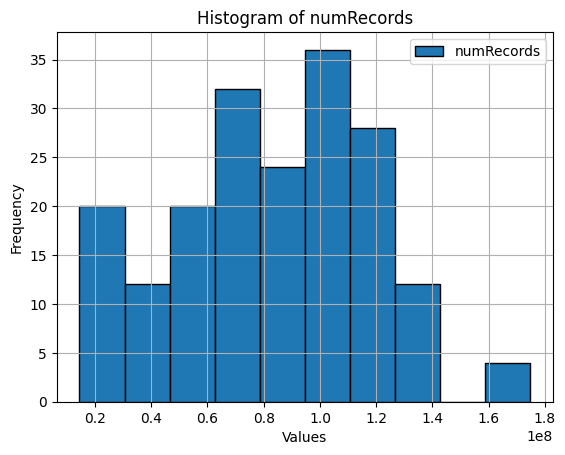

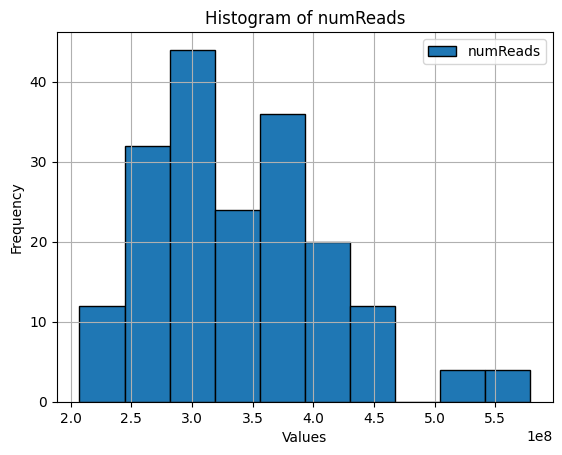

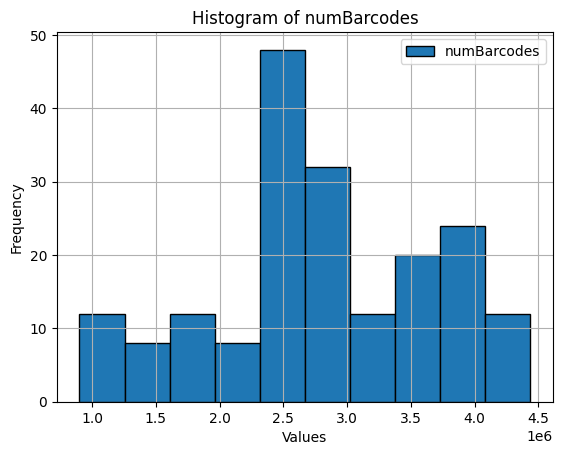

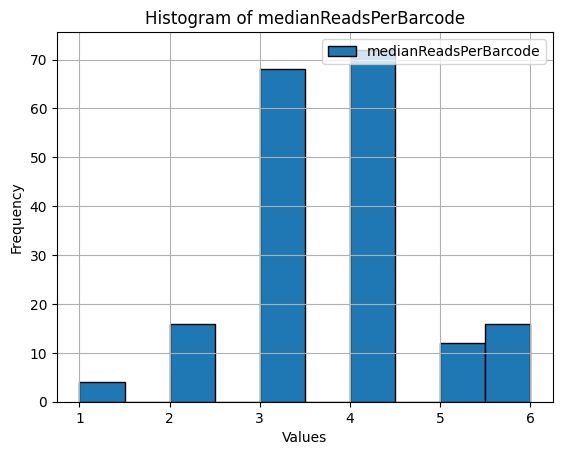

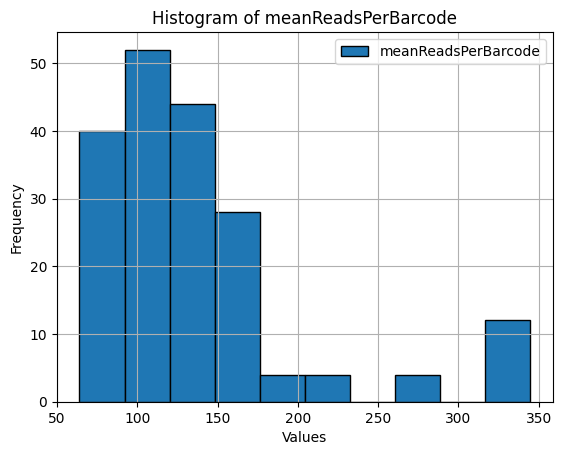

...

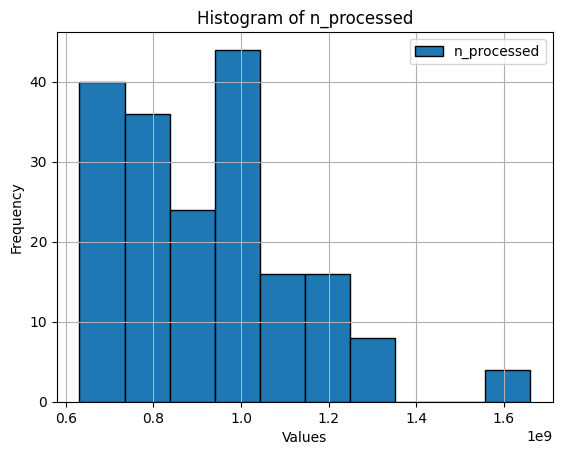

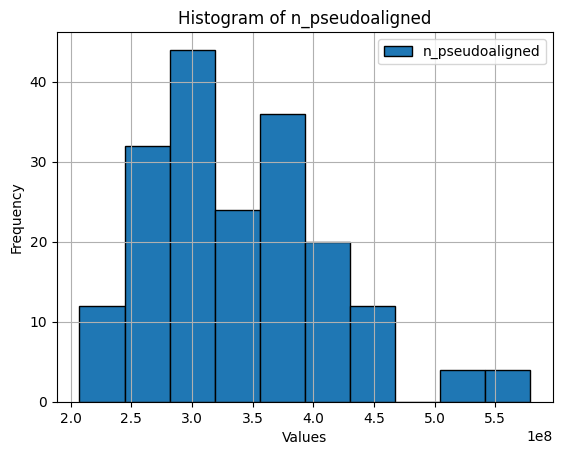

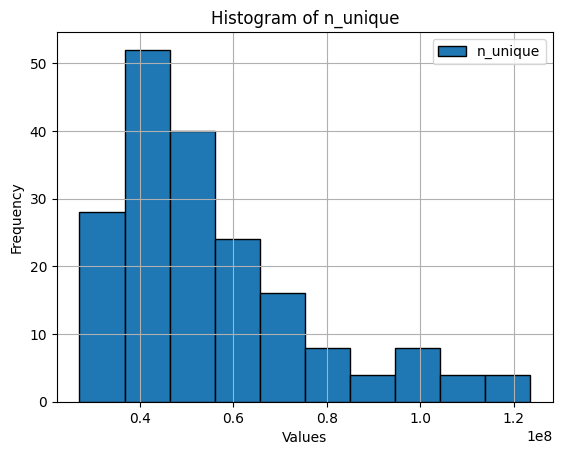

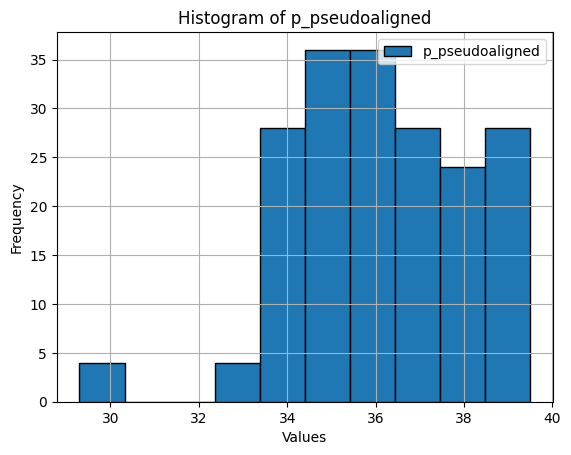

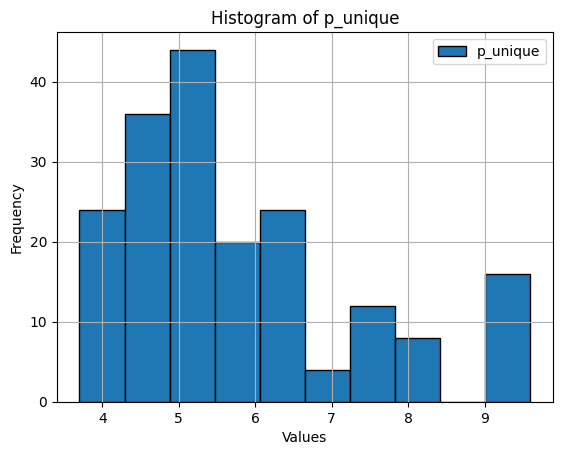

TypeError: no numeric data to plot

In [6]:
for column in run_data_df.select_dtypes(exclude='string').columns:
    run_data_df[column].plot(kind='hist', bins=10, edgecolor='black')
    plt.xlabel('Values')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {column}')
    plt.grid(True)
    plt.legend([column], loc='upper right')
    plt.show()